Based on https://www.kaggle.com/code/maxdiazbattan/wallmart-sales-top-3-eda-feature-engineering

Good prediction pipeline and result in the competition. Worth to try and follow


In [76]:
# Data handling
import pandas as pd
import numpy as np

# Viz
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import matplotlib
import matplotlib.pyplot as plt

# Sklearn
from sklearn import model_selection, metrics
from sklearn.inspection import permutation_importance

# Models
import xgboost as xgb
import lightgbm as lgb
from sklearn import linear_model, ensemble

from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor

# Remove warnings
import warnings
warnings.filterwarnings('ignore') 

In [2]:
features = pd.read_csv('./data/features.csv.zip')
train = pd.read_csv('./data/train.csv.zip')
stores = pd.read_csv('./data/stores.csv')
test = pd.read_csv('./data//test.csv.zip')
sample_submission = pd.read_csv('./data/sampleSubmission.csv.zip')

In [3]:
feature_store = features.merge(stores, how='inner', on = "Store")

In [4]:
train_df = train.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [5]:
test_df = test.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by = ['Store','Dept','Date']).reset_index(drop=True)

In [6]:
feature_store = features.merge(stores, how='inner', on = "Store")

# Converting date column to datetime 
feature_store['Date'] = pd.to_datetime(feature_store['Date'])
train['Date'] = pd.to_datetime(train['Date'])
test['Date'] = pd.to_datetime(test['Date'])

# Adding some basic datetime features
feature_store['Day'] = feature_store['Date'].dt.day
feature_store['Week'] = feature_store['Date'].dt.isocalendar().week
feature_store['Month'] = feature_store['Date'].dt.month
feature_store['Year'] = feature_store['Date'].dt.year

In [7]:
train_df = train.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [8]:
test_df = test.merge(feature_store, how='inner', on = ['Store','Date','IsHoliday']).sort_values(by = ['Store','Dept','Date']).reset_index(drop=True)

##### EDA of the Wallmart Dataset

In [9]:
# date is not liked by describe we delete it from the describe
# This is a nice code snipet to see the contents of a Dataframe coloring outliers and extremes

cols = train_df.columns
a = cols[3:]

train_df[cols[3:]].describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .set_caption("Stats Summary of Numeric Variables")\
                            .background_gradient(subset=['min'], cmap='Reds')\
                            .background_gradient(subset=['max'], cmap='Greens')\
                            .background_gradient(subset=['std'], cmap='GnBu')\
                            .background_gradient(subset=['50%'], cmap='GnBu')

,count,mean,std,min,25%,50%,75%,max
Weekly_Sales,421570.000000,15981.258123,22711.183519,-4988.940000,2079.650000,7612.030000,20205.852500,693099.360000
Temperature,421570.000000,60.090059,18.447931,-2.060000,46.680000,62.090000,74.280000,100.140000
Fuel_Price,421570.000000,3.361027,0.458515,2.472000,2.933000,3.452000,3.738000,4.468000
MarkDown1,150681.000000,7246.420196,8291.221345,0.270000,2240.270000,5347.450000,9210.900000,88646.760000
MarkDown2,111248.000000,3334.628621,9475.357325,-265.760000,41.600000,192.000000,1926.940000,104519.540000
MarkDown3,137091.000000,1439.421384,9623.078290,-29.100000,5.080000,24.600000,103.990000,141630.610000
MarkDown4,134967.000000,3383.168256,6292.384031,0.220000,504.220000,1481.310000,3595.040000,67474.850000
MarkDown5,151432.000000,4628.975079,5962.887455,135.160000,1878.440000,3359.450000,5563.800000,108519.280000
CPI,421570.000000,171.201947,39.159276,126.064000,132.022667,182.318780,212.416993,227.232807
Unemployment,421570.000000,7.960289,1.863296,3.879000,6.891000,7.866000,8.572000,14.313000


In [10]:
palletes = {
   'continuos':{'blues': ['#03045E', '#023E8A', '#0077B6', '#0077B6', '#0096C7', '#00B4D8', '#48CAE4', '#90E0EF', '#ADE8F4', '#CAF0F8'],
                'green_n_blues': ['#D9ED92', '#B5E48C', '#99D98C', '#76C893', '#52B69A', '#34A0A4', '#168AAD', '#1A759F', '#1E6091', '#184E77']
               }
            }

In [11]:
template = dict(layout=go.Layout(font=dict(family="Enriqueta", size=12))) # Cabin | Franklin Bold

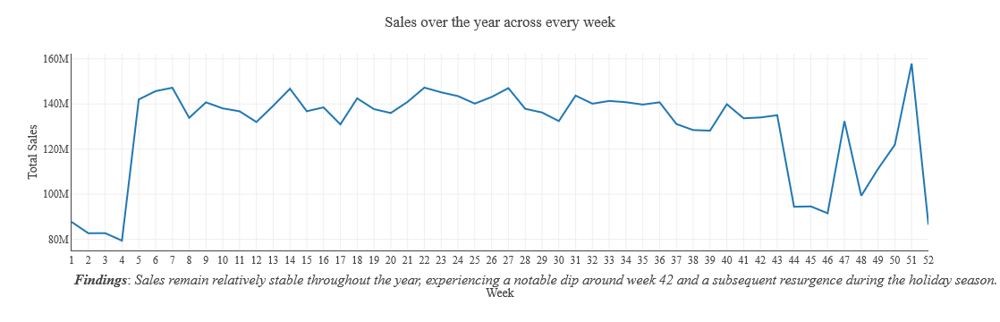

In [23]:
df_weeks = train_df.groupby('Week').sum(numeric_only=True)

fig = px.line(data_frame=df_weeks, x=df_weeks.index, y='Weekly_Sales', 
              template='simple_white', 
              labels={'Weekly_Sales' : 'Total Sales', 'x' : 'Weeks'})

fig.update_layout(
    template=template, 
    title={'text':'Sales over the year across every week'},
    xaxis=dict(tickmode='linear', showline=True), 
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Sales remain relatively stable throughout the year, experiencing a notable dip around week 42 and a subsequent resurgence during the holiday season.</i>", )

#### Markdowns relationship with sales 

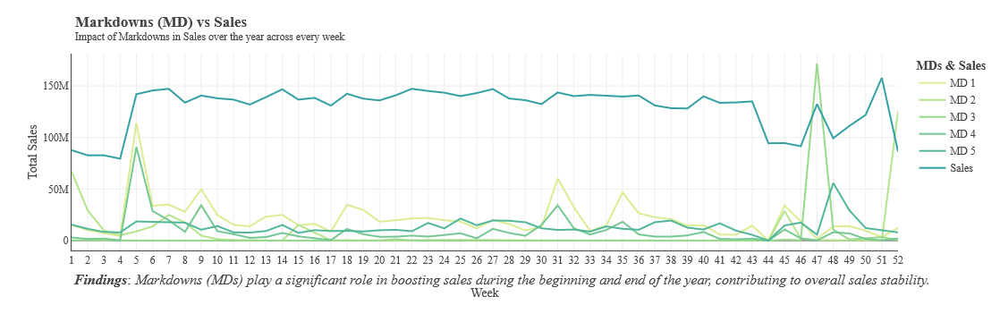

In [24]:
legend_names = {'MarkDown1': "MD 1",
                'MarkDown2': 'MD 2',
                'MarkDown3': 'MD 3',
                'MarkDown4': 'MD 4',
                'MarkDown5': 'MD 5',
                'Weekly_Sales': 'Sales'}


fig = px.line(df_weeks, x=df_weeks.index, y=['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'Weekly_Sales'], 
              color_discrete_sequence=palletes['continuos']['green_n_blues'],
              template='simple_white', 
              labels={'value' : 'Total Sales', 'x' : 'Weeks'})

for trace_index, trace in enumerate(fig.data):
    trace.name = legend_names[trace.name]

fig.update_layout(
    template=template, 
    title={'text':'<b>Markdowns (MD) vs Sales</b><br><sup>Impact of Markdowns in Sales over the year across every week</sup>', 'x': 0.075},
    legend_title_text='<b>MDs & Sales</b>',
    xaxis=dict(tickmode='linear', showline=True), 
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Markdowns (MDs) play a significant role in boosting sales during the beginning and end of the year, contributing to overall sales stability.</i>")

##### Mean sales comparassion across the years  

In [26]:
weekly_sales = train_df.groupby(['Year','Week'], as_index = False).agg({'Weekly_Sales': ['mean', 'median']})
weekly_sales2010 = train_df.loc[train_df['Year']==2010].groupby(['Week']).agg({'Weekly_Sales': ['mean', 'median']})
weekly_sales2011 = train_df.loc[train_df['Year']==2011].groupby(['Week']).agg({'Weekly_Sales': ['mean', 'median']})
weekly_sales2012 = train_df.loc[train_df['Year']==2012].groupby(['Week']).agg({'Weekly_Sales': ['mean', 'median']})

weekly_sales_data = {
    '2010': weekly_sales2010['Weekly_Sales']['mean'].to_dict(),
    '2011': weekly_sales2011['Weekly_Sales']['mean'].to_dict(),
    '2012': weekly_sales2012['Weekly_Sales']['mean'].to_dict()
}

weekly_sales_df = pd.DataFrame(weekly_sales_data)

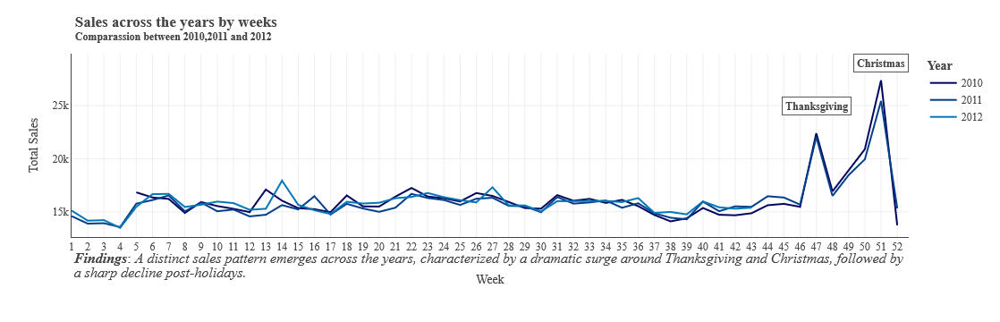

In [27]:
line_columns = ['2010', '2011', '2012']

weekly_sales_df_sorted = weekly_sales_df.sort_index()

fig = px.line(weekly_sales_df_sorted, x=weekly_sales_df_sorted.index, y=line_columns, 
              labels={'x': 'Week', 'value': 'Total Sales'},
              color_discrete_sequence=palletes['continuos']['blues'])


fig.update_layout(
    template=template, 
    margin=dict(b=95),
    title={'text':'<b>Sales across the years by weeks<b><br><sup>Comparassion between 2010,2011 and 2012</sup>', 'x': 0.075}, xaxis_title='Week',
    legend_title_text='<b>Year</b>',
    xaxis=dict(tickmode='linear', showline=True), 
    yaxis=dict(showline=True))

fig.add_annotation(
    x=47, y=25000,
    text="<b>Thanksgiving</b>", 
    bordercolor="#585858",
    showarrow=False, 
    borderpad=2.5, 
    bgcolor='white')

fig.add_annotation(
    x=51, y=29000,
    text="<b>Christmas</b>",  
    bordercolor="#585858", 
    showarrow=False, 
    borderpad=2.5,
    bgcolor='white')

fig.add_annotation(
    x=0, y=-0.25, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>A distinct sales pattern emerges across the years, characterized by a dramatic surge around Thanksgiving and Christmas, followed by<br>a sharp decline post-holidays.</i>")

#### Other features analysis

In [28]:
# Converting the temperature to celsius for a better interpretation
train_df['Temperature'] = train_df['Temperature'].apply(lambda x :  (x - 32) / 1.8)
train_df['Temperature'] = train_df['Temperature'].apply(lambda x :  (x - 32) / 1.8)

In [29]:
train_plt = train_df.sample(frac=.1, random_state=42)

##### Temperature     

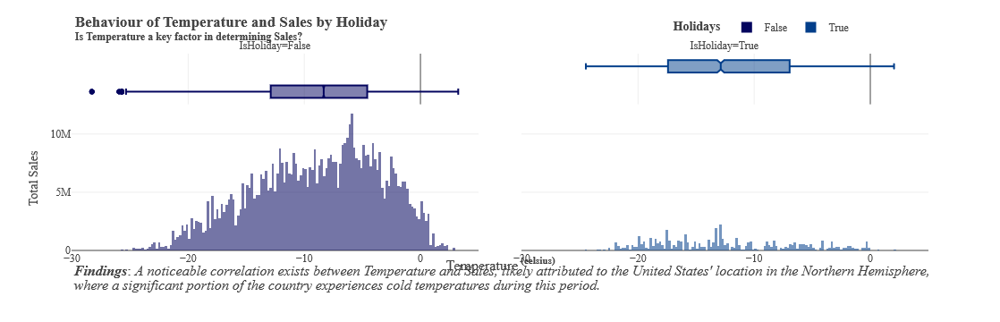

In [30]:
fig = px.histogram(train_plt, x='Temperature', y='Weekly_Sales', color='IsHoliday', marginal='box', opacity=0.55,
                   facet_col='IsHoliday', facet_col_spacing=0.05,
                   color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Behaviour of Temperature and Sales by Holiday<br><sup>Is Temperature a key factor in determining Sales?</sup>', 'x': 0.075}, 
    yaxis_title='Total Sales', xaxis_title=' ',
    legend_title_text='<b>Holidays</b>',
    legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Temperature<sup><b> (celsius)</b>")

fig.add_annotation(
    x=0, y=-0.225, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>A noticeable correlation exists between Temperature and Sales, likely attributed to the United States' location in the Northern Hemisphere,<br>where a significant portion of the country experiences cold temperatures during this period.</i>")

##### Fuel Price       

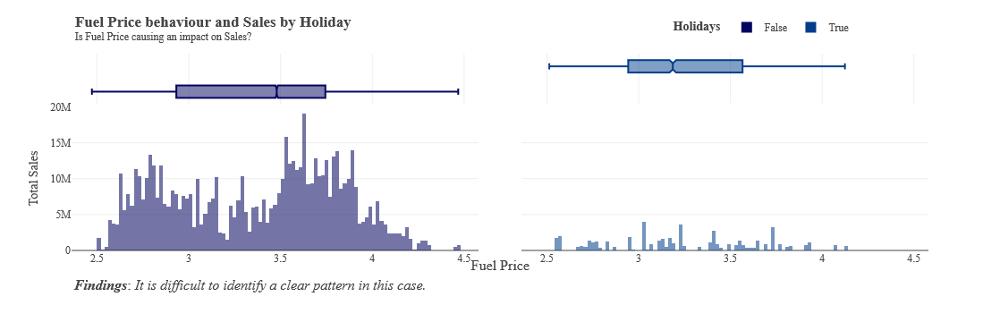

In [31]:
fig=px.histogram(train_plt, x='Fuel_Price', y ='Weekly_Sales', color='IsHoliday', marginal='box', opacity= 0.55,
                 facet_col='IsHoliday', facet_col_spacing=0.05,
                 color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(template=template, 
                  title={'text':'<b>Fuel Price behaviour and Sales by Holiday</b><br><sup>Is Fuel Price causing an impact on Sales?</sup>', 'x': 0.075}, 
                  yaxis_title='Total Sales', xaxis_title='',
                  legend_title_text='<b>Holidays</b>',
                  legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.for_each_annotation(
    lambda x: x.update(text=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Fuel Price")

fig.add_annotation(
    x=0, y=-0.225, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>It is difficult to identify a clear pattern in this case.</i>")

##### Consumer Price Index (CPI)


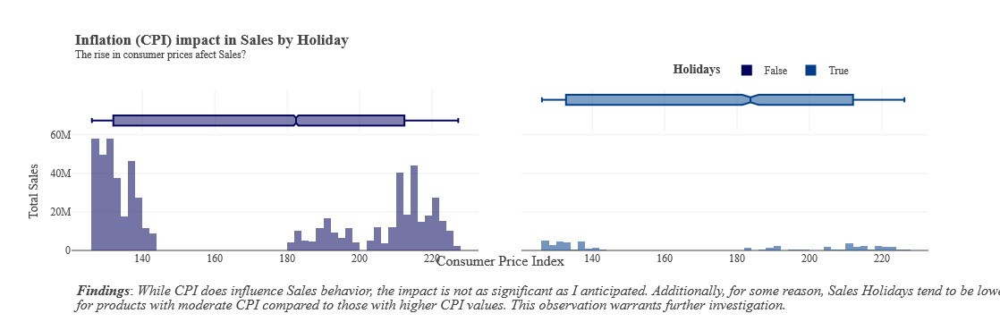

In [37]:
fig = px.histogram(train_plt, x='CPI', y ='Weekly_Sales', color='IsHoliday', marginal='box', opacity= 0.55,
                   facet_col='IsHoliday', facet_col_spacing=0.05,
                   title='CPI and sales by holiday',color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Inflation (CPI) impact in Sales by Holiday</b><br><sup>The rise in consumer prices afect Sales?</sup>', 'x': 0.075}, 
    yaxis_title='Total Sales', xaxis_title='',
    legend_title_text='<b>Holidays</b>',
    legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.for_each_annotation(
    lambda x: x.update(text=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Consumer Price Index")

fig.add_annotation(
    x=0, y=-0.4, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>While CPI does influence Sales behavior, the impact is not as significant as I anticipated. Additionally, for some reason, Sales Holidays tend to be lower<br>for products with moderate CPI compared to those with higher CPI values. This observation warrants further investigation.</i>")

##### Unemployment        

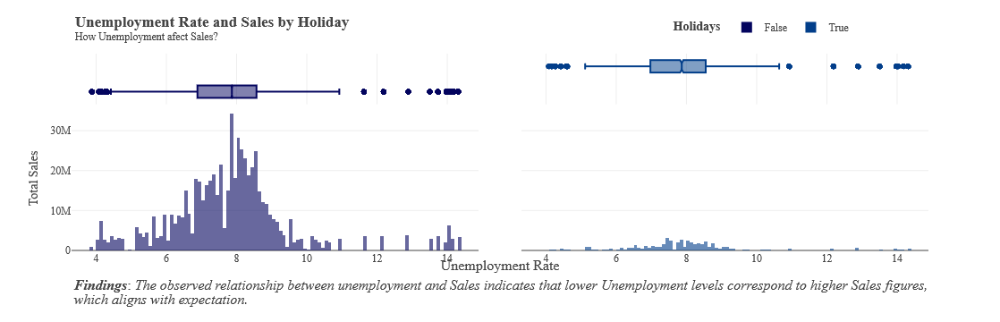

In [39]:
fig = px.histogram(train_plt, x='Unemployment', y ='Weekly_Sales', color='IsHoliday', marginal='box', opacity= 0.6,
                   facet_col='IsHoliday', facet_col_spacing=0.05,
                   color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Unemployment Rate and Sales by Holiday</b><br><sup>How Unemployment afect Sales?</sup>', 'x': 0.075}, 
    yaxis_title='Total Sales', xaxis_title='',
    legend_title_text='<b>Holidays</b>',
    legend=dict(orientation="h", yanchor="top", x=0.7, y=1.2))

fig.for_each_xaxis(
    lambda x: x.update(title=''))

fig.for_each_annotation(
    lambda x: x.update(text=''))

fig.add_annotation(
    x=0.5, y=-0.125, 
    align='center', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'>Unemployment Rate")

fig.add_annotation(
    x=0, y=-0.3, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>The observed relationship between unemployment and Sales indicates that lower Unemployment levels correspond to higher Sales figures,<br>which aligns with expectation.</i>")

##### Store Sizes, Types & Sales     

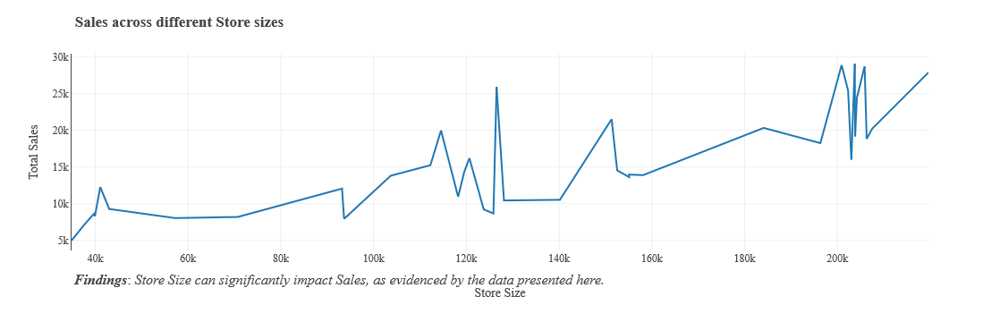

In [41]:
sizes = train_plt.groupby('Size').mean(numeric_only=True)
fig = px.line(sizes, x = sizes.index, y = sizes.Weekly_Sales, template='simple_white',
              labels={'Weekly_Sales' : 'Total Sales', 'Size' : 'Store Size'})

fig.update_layout(
    template=template, 
    title={'text':'<b>Sales across different Store sizes</b>', 'x': 0.075},
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Store Size can significantly impact Sales, as evidenced by the data presented here.</i>", )

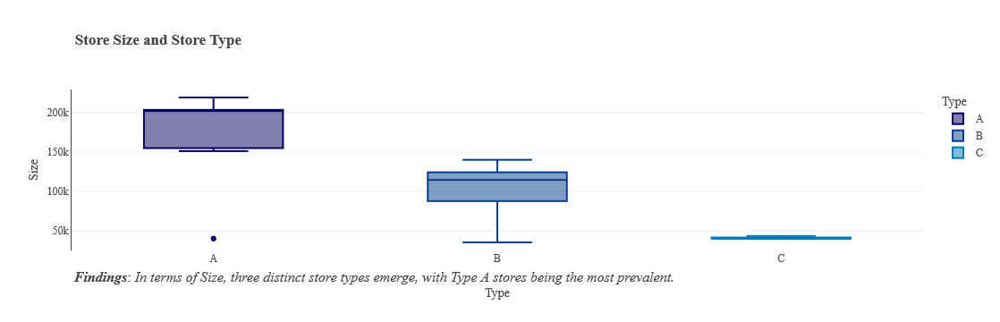

In [42]:
store_type = pd.concat([stores['Type'], stores['Size']], axis=1)

fig = px.box(store_type, x='Type', y='Size', color='Type', 
             title='Store size and Store type',
             color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Store Size and Store Type</b>', 'x': 0.075},
    yaxis_title='Size', 
    xaxis_title='Type',
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.225, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>In terms of Size, three distinct store types emerge, with Type A stores being the most prevalent.</i>")

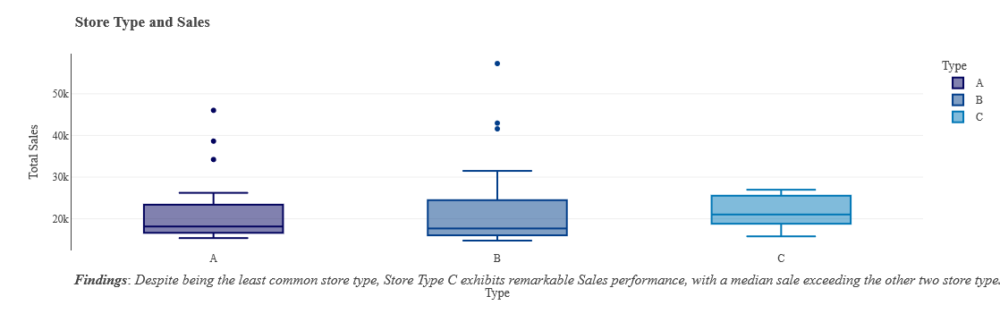

In [43]:
store_sale = pd.concat([stores['Type'], train_df['Weekly_Sales']], axis=1)

fig = px.box(store_sale.dropna(), x='Type', y='Weekly_Sales', color='Type', 
             color_discrete_sequence=palletes['continuos']['blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Store Type and Sales</b>', 'x': 0.075},
    yaxis_title='Total Sales', 
    xaxis_title='Type',
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.2, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Despite being the least common store type, Store Type C exhibits remarkable Sales performance, with a median sale exceeding the other two store types.</i>")

##### Departments       

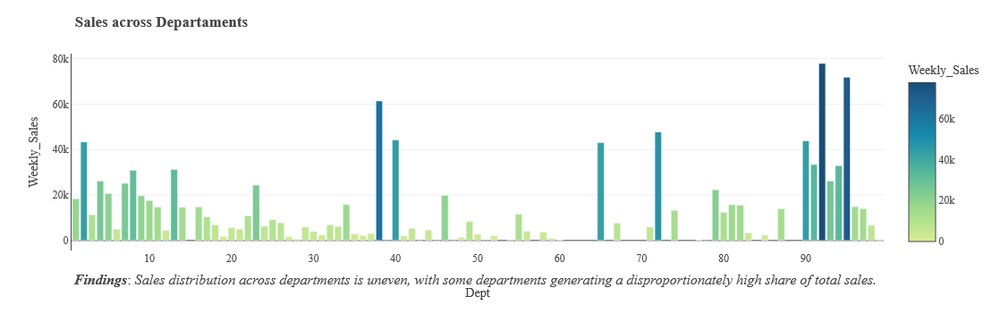

In [45]:
depts = train_plt.groupby('Dept').mean(numeric_only = True).sort_values(by='Weekly_Sales', ascending=False)

fig = px.bar(depts, x=depts.index, y=depts.Weekly_Sales, color=depts.Weekly_Sales, 
             color_continuous_scale=palletes['continuos']['green_n_blues'])

fig.update_layout(
    template=template, 
    title={'text':'<b>Sales across Departaments</b>', 'x': 0.075},
    legend_title_text='<b>Sales</b>',
    yaxis=dict(showline=True))

fig.add_annotation(
    x=0, y=-0.20, 
    align='left', 
    font=dict(size=12),
    textangle=0, 
    xref="paper", 
    yref="paper", 
    showarrow=False,
    text="<span style='font-size:16px;'><b><i>Findings</b></i>: <i>Sales distribution across departments is uneven, with some departments generating a disproportionately high share of total sales.</i>")

#### Heatmap and correlation between features

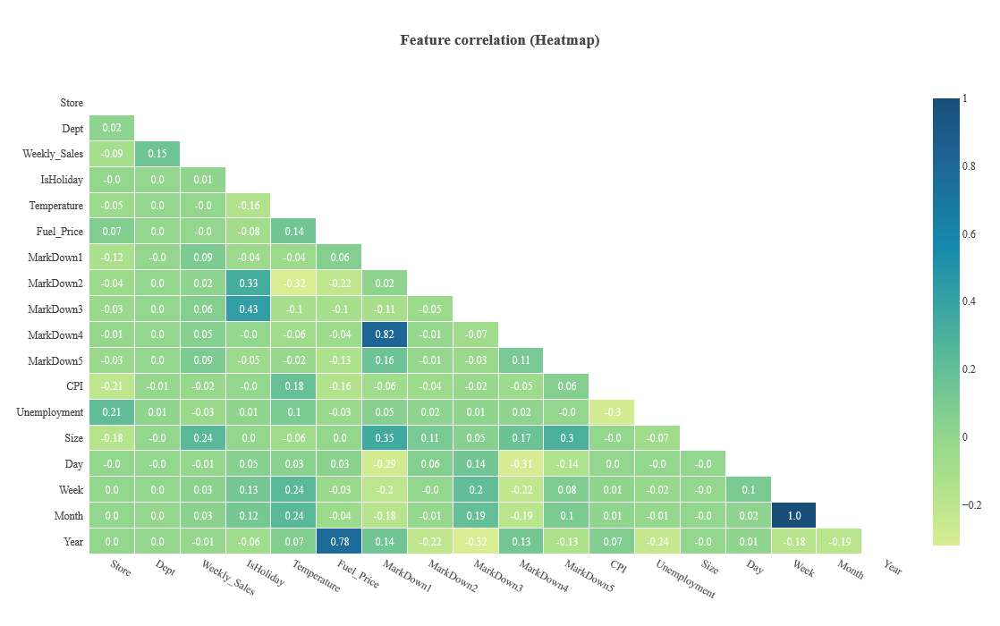

In [47]:
corr = train_df.corr(numeric_only = True)
mask = np.triu(np.ones_like(corr, dtype=bool))
df_mask = corr.mask(mask).round(2)

fig = ff.create_annotated_heatmap(z=df_mask.to_numpy(), 
                                  x=df_mask.columns.tolist(),
                                  y=df_mask.columns.tolist(),
                                  colorscale=palletes['continuos']['green_n_blues'],
                                  hoverinfo="none", 
                                  showscale=True, ygap=1, xgap=1)

fig.update_xaxes(side="bottom")

fig.update_layout(
    template=template, 
    width=900, 
    height=700,
    margin=dict(l=100),
    title={'text':'<b>Feature correlation (Heatmap)</b>', 'x': 0.075},
    title_x=0.5, 
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False,
    yaxis_autorange='reversed',
)

for i in range(len(fig.layout.annotations)):
    if fig.layout.annotations[i].text == 'nan':
        fig.layout.annotations[i].text = ""

fig.show()

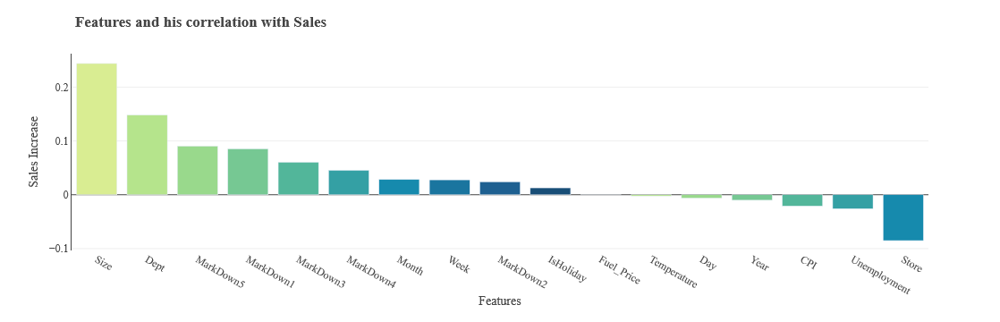

In [49]:
weekly_sales_corr = train_df.corr(numeric_only = True).iloc[2,:]
corr_df = pd.DataFrame(data = weekly_sales_corr, index = weekly_sales_corr.index ).sort_values (by='Weekly_Sales', ascending=False)
corr_df = corr_df.iloc[1:]

fig = px.bar(corr_df, x=corr_df.index, y='Weekly_Sales', color=corr_df.index, labels={'index':'Features'},
             color_discrete_sequence=palletes['continuos']['green_n_blues'])

fig.update_traces(showlegend=False)

fig.update_layout(
    template=template, 
    title={'text':'<b>Features and his correlation with Sales</b>', 'x': 0.075},
    yaxis_title='Sales Increase',
    yaxis=dict(showline=True))

#### Feature engineering 

In [50]:
data_train = train_df.copy()
data_test = test_df.copy()

##### Holidays
Since Thanksgiving and Christmas are the most importarnt holidays, I'm going to try some feature engineering on this features, and also Superbowl and Laborday.


In [51]:
data_train['Days_to_Thansksgiving'] = (pd.to_datetime(train_df["Year"].astype(str)+"-11-24", format="%Y-%m-%d") - pd.to_datetime(train_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)
data_train['Days_to_Christmas'] = (pd.to_datetime(train_df["Year"].astype(str)+"-12-24", format="%Y-%m-%d") - pd.to_datetime(train_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)

In [52]:
data_test['Days_to_Thansksgiving'] = (pd.to_datetime(test_df["Year"].astype(str)+"-11-24", format="%Y-%m-%d") - pd.to_datetime(test_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)
data_test['Days_to_Christmas'] = (pd.to_datetime(test_df["Year"].astype(str)+"-12-24", format="%Y-%m-%d") - pd.to_datetime(test_df["Date"], format="%Y-%m-%d")).dt.days.astype(int)

In [53]:
data_train['SuperBowlWeek'] = train_df['Week'].apply(lambda x: 1 if x == 6 else 0)
data_train['LaborDay'] = train_df['Week'].apply(lambda x: 1 if x == 36 else 0)
data_train['Tranksgiving'] = train_df['Week'].apply(lambda x: 1 if x == 47 else 0)
data_train['Christmas'] = train_df['Week'].apply(lambda x: 1 if x == 52 else 0)

In [54]:
data_test['SuperBowlWeek'] = test_df['Week'].apply(lambda x: 1 if x == 6 else 0)
data_test['LaborDay'] = test_df['Week'].apply(lambda x: 1 if x == 36 else 0)
data_test['Tranksgiving'] = test_df['Week'].apply(lambda x: 1 if x == 47 else 0)
data_test['Christmas'] = test_df['Week'].apply(lambda x: 1 if x == 52 else 0)

##### Markdowns

In [55]:
data_train['MarkdownsSum'] = train_df['MarkDown1'] + train_df['MarkDown2'] + train_df['MarkDown3'] + train_df['MarkDown4'] + train_df['MarkDown5'] 

In [56]:
data_test['MarkdownsSum'] = test_df['MarkDown1'] + test_df['MarkDown2'] + test_df['MarkDown3'] + test_df['MarkDown4'] + test_df['MarkDown5']

##### Preprocessing
##### Filling missing values

In [57]:
data_train.isna().sum()[data_train.isna().sum() > 0].sort_values(ascending=False)

MarkdownsSum    324514
MarkDown2       310322
MarkDown4       286603
MarkDown3       284479
MarkDown1       270889
MarkDown5       270138
dtype: int64

In [58]:
data_test.isna().sum()[data_test.isna().sum() > 0].sort_values(ascending=False)

CPI             38162
Unemployment    38162
MarkdownsSum    37457
MarkDown2       28627
MarkDown4       12888
MarkDown3        9829
MarkDown1         149
dtype: int64

In [59]:
data_train.fillna(0, inplace = True)

In [60]:
data_test['CPI'].fillna(data_test['CPI'].mean(), inplace = True)
data_test['Unemployment'].fillna(data_test['Unemployment'].mean(), inplace = True)

In [61]:
data_test.fillna(0, inplace = True)

##### Encoding categorical data

In [62]:
data_train['IsHoliday'] = data_train['IsHoliday'].apply(lambda x: 1 if x == True else 0)
data_test['IsHoliday'] = data_test['IsHoliday'].apply(lambda x: 1 if x == True else 0)

In [63]:
data_train['Type'] = data_train['Type'].apply(lambda x: 1 if x == 'A' else (2 if x == 'B' else 3))
data_test['Type'] = data_test['Type'].apply(lambda x: 1 if x == 'A' else (2 if x == 'B' else 3))

#### Feature selection

In [64]:
features = [feature for feature in data_train.columns if feature not in ('Date','Weekly_Sales')]

In [65]:
X = data_train[features].copy()
y = data_train.Weekly_Sales.copy()

In [66]:
data_sample = data_train.copy().sample(frac=.25)
X_sample = data_sample[features].copy()
y_sample = data_sample.Weekly_Sales.copy()

In [67]:
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(X_sample, y_sample, random_state=0, test_size=0.15)

In [68]:
feat_model = xgb.XGBRegressor(random_state=0).fit(X_train, y_train)

In [74]:


perm = permutation_importance(feat_model, X_valid, y_valid, n_repeats=10, random_state=1)
importances = pd.Series(perm.importances_mean, index=X_valid.columns.tolist())
# perm = PermutationImportance(feat_model, random_state=1).fit(X_valid, y_valid)
#features = eli5.show_weights(perm, top=len(X_train.columns), feature_names = X_valid.columns.tolist())

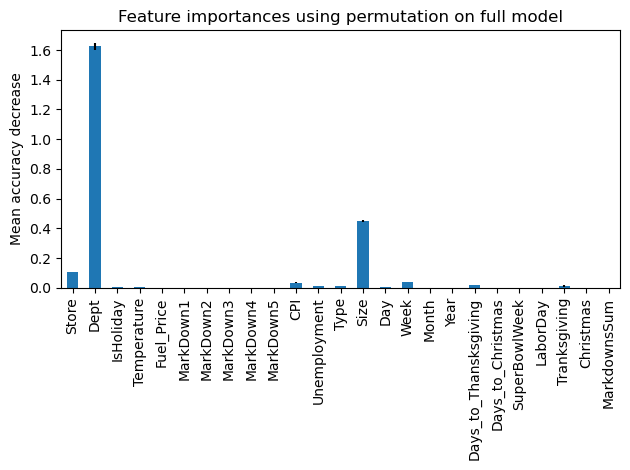

In [78]:
fig, ax = plt.subplots()
importances.plot.bar(yerr = perm.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

##### Dept, Store, Size, CPI, Week, are the top 5 features

##### Modeling

In [79]:
# Eval metric for the competition
def WMAE(dataset, real, predicted):
    weights = dataset.IsHoliday.apply(lambda x: 5 if x else 1)
    return np.round(np.sum(weights*abs(real-predicted))/(np.sum(weights)), 2)

In [81]:
models = {
          '    LGBM': lgb.LGBMRegressor(random_state = 0, verbose_eval=False),
          ' XGBoost': xgb.XGBRegressor(random_state = 0, objective = 'reg:squarederror'),       
          '    HGBR': HistGradientBoostingRegressor(random_state = 0),
          ' ExtraTr': ensemble.ExtraTreesRegressor(bootstrap = True, random_state = 0),
          ' RandomF': ensemble.RandomForestRegressor(random_state = 0),
         }

In [82]:
def model_evaluation (name, model, models, X_train, y_train, X_valid, y_valid):
   
    rmses = []
    
    for i in range(len(models)):
    
        # Model fit
        model.fit(X_train, y_train)
        
        # Model predict
        y_preds = model.predict(X_valid)

        # RMSE
        rmse = np.sqrt(np.mean((y_valid - y_preds)**2))
        rmses.append(rmse)
        
    return np.mean(rmses)

In [ ]:
for name, model in models.items():
    print(name + ' Valid RMSE {:.4f}'.format(model_evaluation(name, model, models, X_train, y_train, X_valid, y_valid)) )

Seems to be RandomForest it's the best baseline model by default, followed by ExtraTrees, but we can improve the score of boosting models by doing hyperparameter optimization. Also, for a more generalizable model you can do a blend of the best models at the end.

##### Here you must perform a hyperparameter tuning for all models I am sure you can improve the result......

In [95]:
##### First submission only Random Forest predictions

In [96]:
X_baseline = X[['Store','Dept','IsHoliday','Size','Week','Type','Year','Day']].copy()

In [97]:
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(X_baseline, y, random_state=0, test_size=0.1)

In [ ]:
RF = ensemble.RandomForestRegressor(n_estimators=60, max_depth=25, min_samples_split=3, min_samples_leaf=1)
RF.fit(X_train, y_train)

In [ ]:
test = data_test[['Store','Dept','IsHoliday','Size','Week','Type','Year','Day']].copy()
predict_rf = RF.predict(test)

In [ ]:
sample_submission['Weekly_Sales'] = predict_rf
sample_submission.to_csv('submission.csv',index=False)

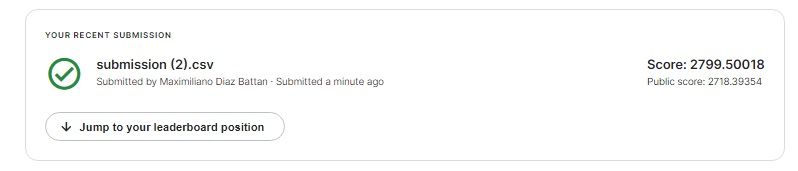

##### Second submission : Simple Blend using average of weights from two best models

In [ ]:
ETR = ensemble.ExtraTreesRegressor(n_estimators=50, bootstrap = True, random_state = 0)
ETR.fit(X_train, y_train)

In [ ]:
predict_etr = ETR.predict(test)

In [ ]:
avg_preds = (predict_rf + predict_etr) / 2

In [ ]:
sample_submission['Weekly_Sales'] = avg_preds
sample_submission.to_csv('submission.csv',index=False)

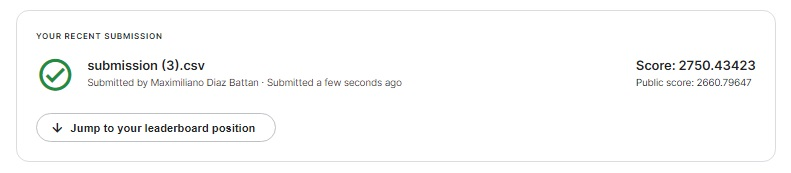

<p style="font-size:22.5px; font-family:cabin; line-height: 1.7em; margin-left:30px">
Thanks for taking the time to read my notebook </p>